In [1]:
import numpy as np
import torch
from torchvision import transforms
import cv2
import matplotlib
import matplotlib.pyplot as plt
from XAI import IntegratedGradients, attribution_mask_processing, GradCAM, FeatureMaps
from models import VGGFace, NCNN
from torchvision import models
import torch.nn as nn


In [2]:
import matplotlib.pyplot as plt
import numpy as np
from math import ceil

def plot_image_grid(images, masks, alphas=None, grid_size=None, figsize=(10, 10), img_size=224):
    """
    Plots images with their corresponding masks in a grid.

    Parameters:
        images (list): List of PIL images.
        masks (list): List of masks (NumPy arrays) corresponding to each image.
        grid_size (tuple, optional): (rows, cols) for the grid. If None, it auto-calculates a square layout.
        figsize (tuple, optional): Figure size for the plot.
    """
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["green","yellow","red"])
    num_images = len(images)
    
    # Determine grid size automatically if not provided
    if grid_size is None:
        cols = ceil(np.sqrt(num_images))
        rows = ceil(num_images / cols)
    else:
        rows, cols = grid_size

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).reshape(-1)  # Flatten in case of inconsistent shapes
    
    for i, ax in enumerate(axes):
        if i < num_images:
            img_resized = images[i].resize((img_size, img_size))
            mask_resized = masks[i]
            alphas_resized = alphas[i] if alphas is not None else None

            ax.imshow(img_resized)
            if alphas is not None:
                ax.imshow(mask_resized, alpha=alphas_resized, cmap=cmap)
            else:
                ax.imshow(mask_resized, alpha=0.5, cmap=cmap)  # Overlay mask with transparency
            ax.axis("off")
        else:
            ax.axis("off")  # Hide empty subplots
    
    plt.tight_layout()
    plt.show()


### Load model

In [ ]:
model = NCNN()
#model.load_state_dict(torch.load('experiments\\20250310_2005_NCNN\\Model\\best_model.pt', map_location=torch.device('cpu'))) 
model.load_state_dict(torch.load('experiments\\20250310_1955_NCNN\\Model\\best_model.pt', map_location=torch.device('cpu'))) #pretreinado
model.eval()

### Define image pre-processing

More information about models pre-processing can be found in ``dataloaders``.

In [ ]:
# Define the required transformations for the VGGNB
img_size = 224
transform = transforms.Compose([     
            transforms.ToTensor(),
            transforms.Resize((img_size,img_size)),
            transforms.Normalize(
                mean=[0.36703529, 0.41083294, 0.50661294], std=[1, 1, 1])
        ])

In [ ]:
img_size = 120
transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.52026823, 0.40445255, 0.34655508],
                                std=[0.28127891, 0.24436931, 0.23583611])
                
        ])

In [ ]:
img_size = 120
transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
        ])

### Load the image

In [ ]:
import os
from PIL import Image

images = []
path_img = f'Datasets\\Folds\\0\\Test'

for img in os.listdir(path_img):
    if ".jpg" in img:
        image = Image.open(os.path.join(path_img,img)).convert("RGB")
        image = image.resize((img_size,img_size))
        images.append(image)



In [ ]:
transformed_images = torch.stack([transform(image) for image in images])


## TeST FEATURE MAPS

In [ ]:
test = FeatureMaps(model, model.VGGFace.features.conv5_3, 'cuda')

In [ ]:
mask_test = torch.tensor(test.get_featuremaps(transformed_images))

In [ ]:
mask_test.unsqueeze(0).shape

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
def pca(feats, dim=3, fit_pca=None):
    B, C, H, W = feats.shape
    x = feats.permute(1, 0, 2, 3).reshape(C, B * H * W).permute(1, 0).detach().cpu().numpy()
    if fit_pca is None:
        fit_pca = PCA(n_components=dim).fit(x)
    x_red = torch.from_numpy(fit_pca.transform(x))
    x_red -= x_red.min(dim=0, keepdim=True).values
    x_red /= x_red.max(dim=0, keepdim=True).values
    return x_red.reshape(B, H, W, dim).permute(0, 3, 1, 2).to(feats.device), fit_pca

In [ ]:
dim = 3

In [ ]:
pca_test, fit_pca = pca(mask_test, dim=dim)

In [ ]:
pca_test.shape

In [ ]:
i = 0

new_pca = np.array(pca_test[i].permute(1,2,0).detach().cpu())
mask_testt = cv2.resize(new_pca,(224,224))

plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
plt.imshow(images_RGB[i])
plt.imshow(mask_testt, alpha=0.8)
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(mask_testt[:,:,0], alpha=0.8)
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(mask_testt[:,:,1], alpha=0.8)
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(mask_testt[:,:,2], alpha=0.8)
plt.axis('off')

In [ ]:
mask_testt.max()

In [ ]:

torch.cuda.empty_cache()

### Create IG and GC object

Instatiate the Integrated Gradients and GradCam, for the GradCAM we are going to use the ``conv5_3`` layer as target.

In [ ]:
ig = IntegratedGradients(model, device='cuda')
gradcam = GradCAM(model, model.conv_4, device='cuda')

In [ ]:
transformed_images.shape

Generates attribution masks based on provide image and target class.

In [ ]:
# Generate the attribution mask
mask_ig = ig.attribution_mask(transformed_images)
mask_gc = gradcam.attribution_mask(transformed_images)

In [ ]:
i = 0

In [ ]:
plt.subplot(1,2,1)
plt.imshow(mask_ig[i])
plt.axis('off')
plt.title('Attribution Mask IG')

plt.subplot(1,2,2)
plt.imshow(mask_gc[i])
plt.axis('off')
plt.title('Attribution Mask GC')

This is a very poor visualization of the attribution mask. But using the below method we can enhance the visualisation and provide visual understanding of the model's predictions.

### Attribution mask post-processing

Attribution mask post-processing aims to remove redundant information from the original attribution masks, making visualisation and comparisson easier.

There are several parameters that can be tweaked in order to achieve better visualisations on ``attribution_mask_post_processing``.

In [ ]:
result_cam = []
alpha_channel_cam = []

for mask in mask_gc:
    gc_post, gc_alpha = attribution_mask_processing(mask)
    result_cam.append(gc_post)
    alpha_channel_cam.append(gc_alpha)

result_ig = []
alpha_channel_ig = []

for mask in mask_ig:
    ig_post, ig_alpha = attribution_mask_processing(mask)
    result_ig.append(ig_post)
    alpha_channel_ig.append(ig_alpha)

### Final visualization

In [ ]:
# Define the plot colors
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["green","yellow","red"])

# Plot                                                    
plt.subplot(2,2,1)
plt.title('IG')
plt.imshow(mask_ig[i])
plt.imshow(images[i], alpha=0.5)
plt.axis('off')

plt.subplot(2,2,2)
plt.title('IG with Post-Processing')
plt.imshow(images[i])
plt.imshow(result_ig[i], cmap=cmap, alpha=alpha_channel_ig[i])
plt.axis('off')

plt.subplot(2,2,3)
plt.title('GC')
plt.imshow(mask_gc[i])
plt.imshow(images[i], alpha=0.5)
plt.axis('off')

plt.subplot(2,2,4)
plt.title('GC with Post-Processing')
plt.imshow(images[i])
plt.imshow(result_cam[i], cmap=cmap, alpha=alpha_channel_cam[i])
plt.axis('off')

plt.show()

In [ ]:
predictions = model.predict(transformed_images.to('cuda'))

In [ ]:
predictions[i]

In [ ]:
plot_image_grid(images, result_cam, alpha_channel_cam, figsize=(15, 15), img_size=img_size)

In [3]:
import torch.nn as nn
import os
from PIL import Image
import torch
from torchvision import models, transforms
from XAI import IntegratedGradients, attribution_mask_processing, GradCAM, FeatureMaps
import matplotlib.pyplot as plt
from models import *

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
model = iresnet50()
checkpoint = torch.load('D:\\Doutorado\\Cassia Test\\R50\\backbone (1).pth', map_location=device, weights_only=False)
model.load_state_dict(checkpoint)

In [6]:
model = VGG16ArcFace()

checkpoint = torch.load('D:\\Doutorado\\Cassia Test\\ms1mv3_arcface_VGG16\\model.pt', map_location=device, weights_only=False)
model.load_state_dict(checkpoint)


<All keys matched successfully>

In [5]:
model = PainClassifier()

#checkpoint = torch.load('D:\\Doutorado\\Cassia Test\\ms1mv3_arcface_VGG16BN\\ms1mv3_arcface_VGG16\\model.pt', map_location=device, weights_only=False)
#model.load_state_dict(checkpoint)


In [5]:
model = VGGFace()
model.VGGFace.classifier = nn.Sequential(
    nn.Linear(25088, 1))

checkpoint = torch.load('D:\\Doutorado\Mestrado\\experiments\\VGGFACE_FINETUNE_LAST_CONV\\20250525_1540_VGGFace\\Model\\best_model.pt', map_location=device, weights_only=False)
model.load_state_dict(checkpoint)


<All keys matched successfully>

In [ ]:
model = NCNN()
model.classifier = nn.Sequential(nn.Linear(1600,512, bias=False),
                                 nn.BatchNorm1d(512))

checkpoint = torch.load('D:\\Doutorado\\Cassia Test\\ms1mv3_arcface_NCNN\\model.pt', map_location=device, weights_only=False)
model.load_state_dict(checkpoint)


In [6]:

img_size = 224
val_transforms = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])

In [7]:

img_size = 224
val_transforms = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5],
                             std=[0.5, 0.5, 0.5]),
    ])

In [8]:
model = model.to(device)
model.eval()

VGG16ArcFace(
  (vgg): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True)
      (16

In [9]:
import os

images = []
path_img = f'Datasets\\Folds\\0\\Test'
#path_img = 'D:\\Doutorado\\Cassia Test\\CassiaWebFace\\val\\000030'

for img in os.listdir(path_img):
    if ".jpg" in img:
        image = Image.open(os.path.join(path_img,img)).convert("RGB")
        images.append(image)

transformed_images = torch.stack([val_transforms(image) for image in images])

In [10]:
transformed_images[0]

tensor([[[ 0.1922,  0.2157,  0.0431,  ...,  0.2627,  0.2549,  0.2471],
         [ 0.1922,  0.2235,  0.0667,  ...,  0.2784,  0.2706,  0.2627],
         [ 0.0510,  0.2000,  0.1059,  ...,  0.2863,  0.2784,  0.2627],
         ...,
         [ 0.3412,  0.3725,  0.4275,  ...,  0.3255,  0.2706,  0.2235],
         [ 0.3412,  0.3961,  0.4510,  ...,  0.3255,  0.2784,  0.2157],
         [ 0.3333,  0.3725,  0.4196,  ...,  0.3176,  0.2627,  0.2078]],

        [[ 0.0510,  0.0745, -0.0980,  ...,  0.2078,  0.2157,  0.2157],
         [ 0.0510,  0.0745, -0.1137,  ...,  0.2235,  0.2314,  0.2314],
         [-0.0824,  0.0275, -0.1137,  ...,  0.2314,  0.2392,  0.2314],
         ...,
         [ 0.0667,  0.0667,  0.0510,  ...,  0.2392,  0.1608,  0.1137],
         [ 0.1765,  0.2235,  0.2471,  ...,  0.2471,  0.1843,  0.1216],
         [ 0.2314,  0.2863,  0.3255,  ...,  0.2471,  0.1922,  0.1373]],

        [[ 0.0196,  0.0353, -0.1529,  ...,  0.1451,  0.1529,  0.1373],
         [ 0.0196,  0.0353, -0.1529,  ...,  0

In [11]:
transformed_images.shape

torch.Size([109, 3, 224, 224])

In [12]:
images[0].size

(512, 512)

In [ ]:
#NCNN
gradcam = GradCAM(model, model.merge_branch[0], reshape_transform_ViT=False, device=device)
mask_gc = gradcam.attribution_mask(transformed_images)

In [12]:
#VGG
gradcam = GradCAM(model, model.VGGFace.features.conv5_3, reshape_transform_ViT=False, device=device)
mask_gc = gradcam.attribution_mask(transformed_images)

In [13]:
#PainClassifier
gradcam = GradCAM(model, model.vgg.features[28], reshape_transform_ViT=False, device=device)
mask_gc = gradcam.attribution_mask(transformed_images)

In [ ]:
#R50
gradcam = GradCAM(model, model.layer4[2].conv2, reshape_transform_ViT=False, device=device)
mask_gc = gradcam.attribution_mask(transformed_images)

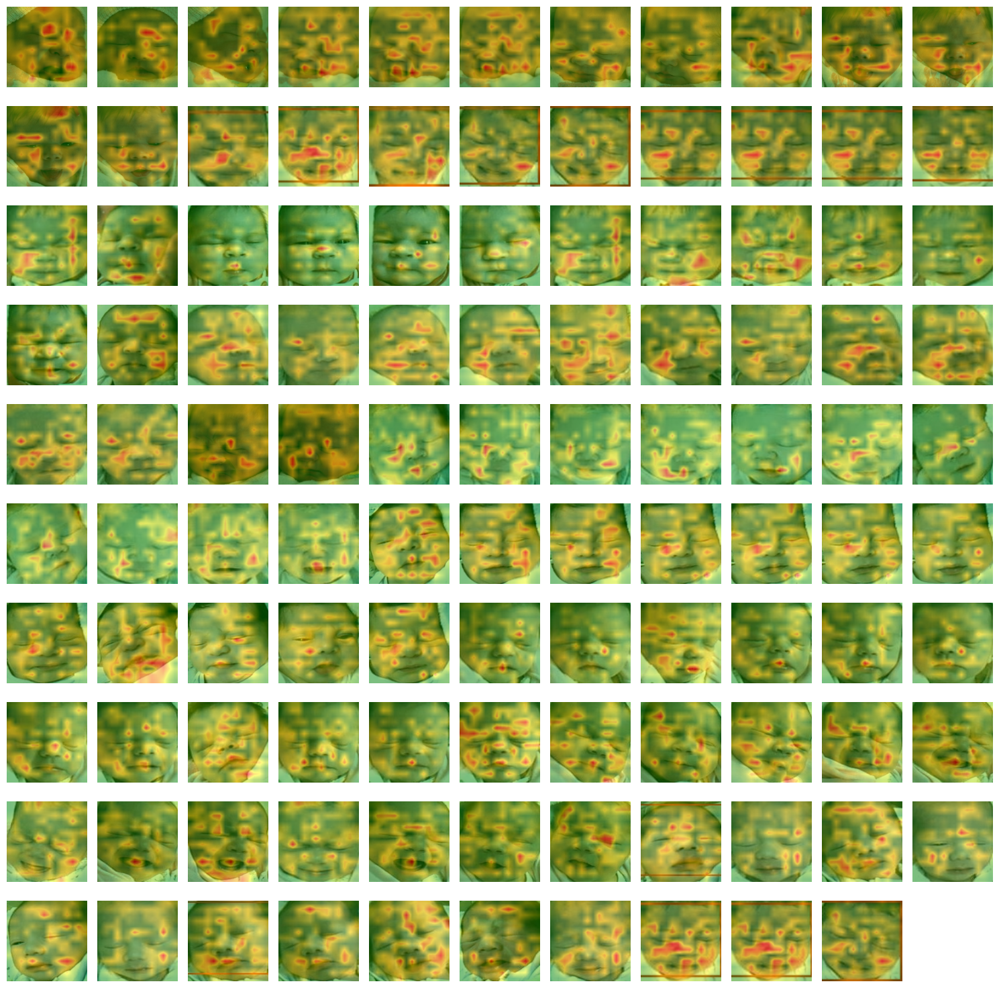

In [14]:
plot_image_grid(images, mask_gc, figsize=(15, 15), img_size=img_size)

In [19]:
ig = IntegratedGradients(model, device='cuda')
mask_ig = ig.attribution_mask(transformed_images)

In [20]:
mask_ig[1].max()

0.9999994

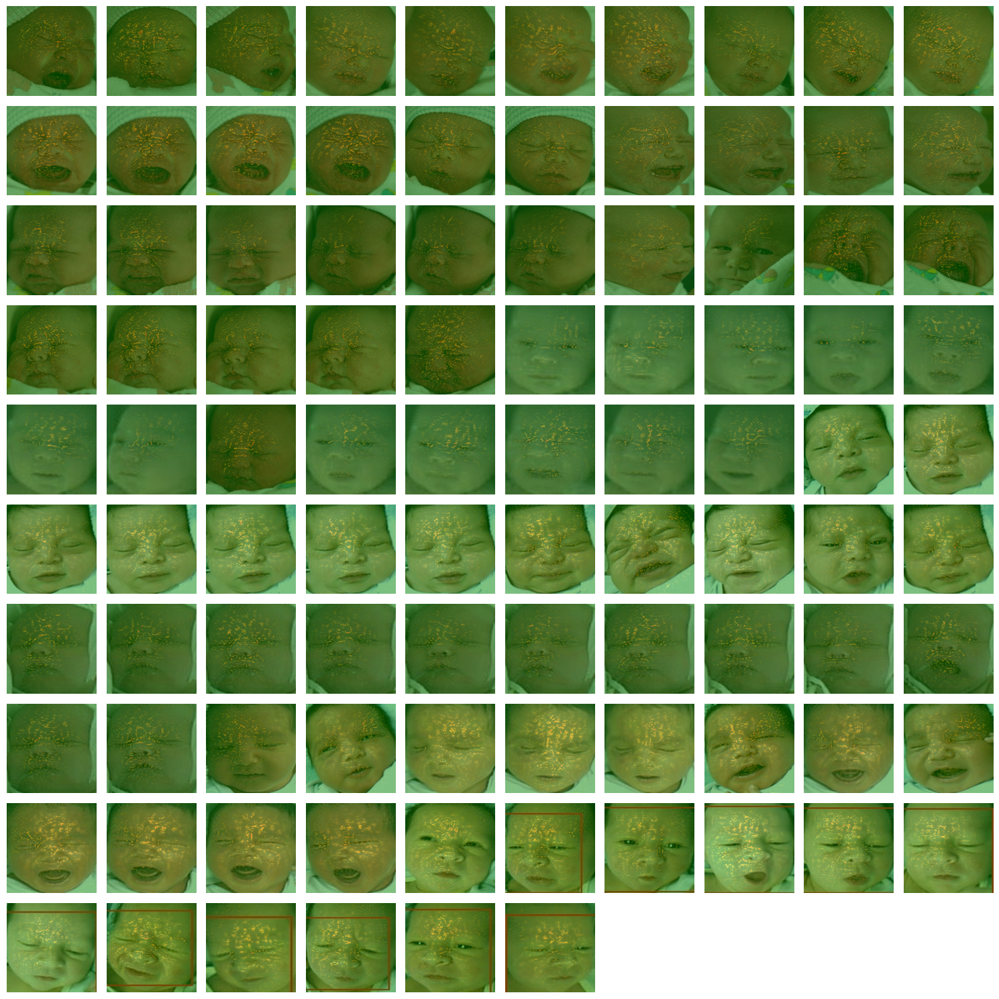

In [21]:
plot_image_grid(images, mask_ig, figsize=(15, 15), img_size=img_size)

In [22]:
model

PainClassifier(
  (arcface_model): VGG16(
    (vgg): VGG(
      (features): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
        (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (6): ReLU(inplace=True)
        (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (8): ReLU(inplace=True)
        (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (11): ReLU(inplace=True)
        (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (13): ReLU(inplace=True)
        (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1

In [13]:
model.arcface_model.vgg.features[24:]

Sequential(
  (24): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (25): ReLU(inplace=True)
  (26): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (27): ReLU(inplace=True)
  (28): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (29): ReLU(inplace=True)
  (30): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)

In [ ]:
"D:\\Doutorado\\Mestrado\\experiments\\ViT_B_32_ENSEMBLE_FINAL\\icopevid\\MERGED_MASKS"

C:\Users\leonardo\AppData\Local\Temp\ipykernel_31344\2236258271.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("jet")


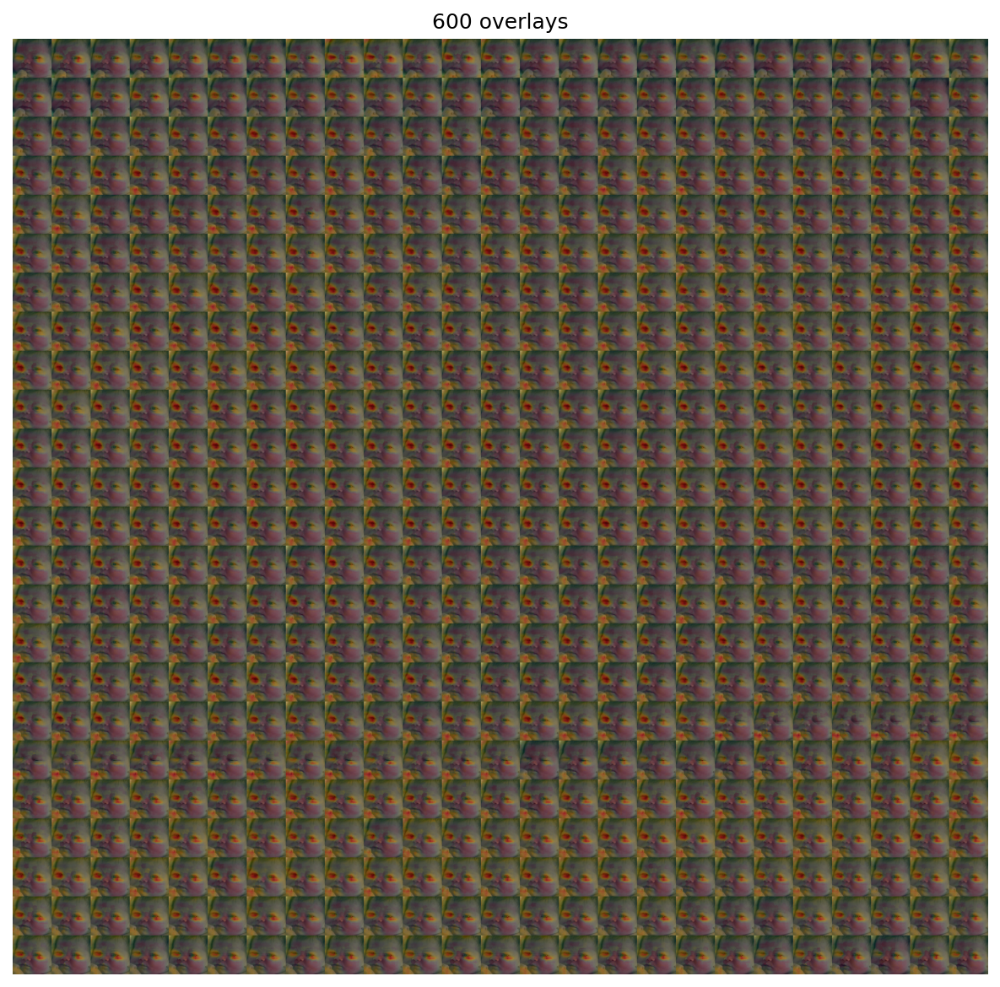

In [5]:
from pathlib import Path
import math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import matplotlib.pyplot as plt
cmap = plt.cm.get_cmap("jet")

mask_root = Path(r"D:\Doutorado\Mestrado\experiments\ViT_B_32_ENSEMBLE_FINAL\icopevid\MERGED_MASKS")
img_root = Path(r"D:\Doutorado\Mestrado\Datasets\Originais\iCOPE\iCOPEvid\all_frames\S023_Rest_1_[0]_20s")

mask_files = sorted(mask_root.glob("*.npz"))

# index images by stem
img_files = []
for ext in ("*.png", "*.jpg", "*.jpeg", "*.bmp", "*.tif", "*.tiff"):
    img_files.extend(img_root.glob(ext))
img_map = {p.stem: p for p in img_files}

def load_mask(path):
    with np.load(path) as npz:
        if "mask_raw" not in npz:
            return None
        mask = np.squeeze(npz["mask_raw"]).astype(np.float32)
        if mask.ndim != 2:
            raise ValueError(f"{path} mask_raw has shape {mask.shape}, expected 2D")
        return np.clip(mask, 0.0, 1.0)

def load_image(path, size_hw=None):
    img = Image.open(path).convert("RGB")
    if size_hw is not None:
        h, w = size_hw
        if img.size != (w, h):
            img = img.resize((w, h), Image.BILINEAR)
    return np.asarray(img, dtype=np.float32) / 255.0

# find first valid pair to get shape
h = w = None
for p in mask_files:
    m = load_mask(p)
    if m is None:
        continue
    img_path = img_map.get(p.stem)
    if img_path is None:
        continue
    h, w = m.shape
    break
if h is None:
    raise ValueError("No matching (mask,image) pairs found by stem")

pairs = []
for p in mask_files:
    img_path = img_map.get(p.stem)
    if img_path is None:
        continue
    pairs.append((p, img_path))

n = len(pairs)
if n == 0:
    raise ValueError("No matching (mask,image) pairs found by stem")

ncols = math.ceil(math.sqrt(n))
nrows = math.ceil(n / ncols)

canvas = np.zeros((nrows * h, ncols * w, 3), dtype=np.float32)

alpha = 0.4
overlay_color = np.array([1.0, 0.0, 0.0], dtype=np.float32)

for i, (mask_path, img_path) in enumerate(pairs):
    mask = load_mask(mask_path)
    img = load_image(img_path, size_hw=(h, w))

    heat = cmap(mask)[:, :, :3]  # RGB in [0,1]

    blended = img * (1.0 - alpha * mask[..., None]) + heat * (alpha * mask[..., None])

    r, c = divmod(i, ncols)
    canvas[r * h:(r + 1) * h, c * w:(c + 1) * w, :] = blended

plt.figure(figsize=(ncols * 0.4, nrows * 0.4), dpi=150)
plt.imshow(canvas)
plt.axis("off")
plt.title(f"{n} overlays")
plt.show()
